* Segregation
    * Segregation in 1D and 2D
    * Effects of proprtions
    * Effects of thresholds
        * Uniform thresholds
        * Different thresholds
    * Effects of threshold limits
    * No fixed neighborhood boundaries
        * Effects of neighborhood area
    * Fixed neighborhood boundaries
* Peer effects
    * Effects of thresholds on outcomes
        * Homogenous thresholds - just the value
        * Heterogenous thresholds
            * different distributions
            * multiple thresholds
    * Equilibrium analysis
        * Cumulative distribution function vs threshold and equilibrium
        * Standard deviation of thresholds (normal dist) vs equilibrium rioters
    * Effects of sampling on outcomes
    * Effects of influence (e.g. weight of an individual to thresholds)
    * Rational agents and perfect information
    * Partially irrational agents and imperfect information
    * Changing thresholds over time
        * Misperception of proportions
        * Hiding agents
    * Applications
        * Joining a riot
        * Spread of rumors
        * Going to a restaurant
        * El Farol Bar
        * Leaving a party
*         
* Notes
    * Check effects of different initializations
    * Check stability of equilibria vs say perturbed thresholds (add noise, remove some people)

* References
    * Schelling
    * Granovetter
    * Think Complexity Allan Downey
    
* Programming 
    * parameters
        * neighborhood size
        * classes (empty, 0, 1) 
        * proportion per class (empty, 0, 1)
        * neighborhood size (kernel)
    * define a class for the model
    * generate an array of agents and empty spaces
    * use correlate2d(1D array of True/False values, kernel, mode='same', boundary='wrap')
        * 
    * use np.where (array_true_false, array_a, array_b) - if True, array_a, else array_b
    

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import convolve # for counting neighbors in 1d
from scipy.signal import correlate2d # for counting neighbors in 2d
import os, shutil
import imageio
import glob
from tqdm import tqdm
from IPython.display import Image

import warnings # suppress all warnings
warnings.filterwarnings("ignore")

## Segregation
Some questions Schelling's model was trying to answer:
* Do people segregate into highly polarized groups because they are hate the other group? Or they prefer to be with their own kind so much that they segregate?

### Segregation in 1D
* Given
    * `p` - a fixed proportion of agent 1, agent 2, and empty spaces (houses)
    * `n` - linear neighborhood (1 dimension) randomly populated by n agents and some empty spaces
    * `thresholds` - A fixed set of thresholds of the minimum proportion of similar nearby neighbors for each agent that will make them happy
    * `k` - The distance to the left and right, k, from the agent that defines nearby neighbors. Those at the far left, will have no nearby neighbors to the left and k nearby neighbors to the right
    * `travel_lim` - True/False whether we limit the travel to k or not
* Objective - the agents will move into positions that will make all / most of them happy
* Rules
    * From the current positions, an unhappy agent is randomly selected (Schelling selected from left to right)
    * That agent will them randomly select a vacant position that will make the agent happy
        * In Schelling's 1D set up, there were no vacant areas and the agent looks for points between other agents where it can squeeze itself into
        * Moving into vacant areas on the othat hand is more intuitive because we can think of them as empty houses people move into. You don't really make your own space by squeezing into two occupied houses.
        * This rule is applied in Schelling's 2D model
    * We repeat until we reach stability (nobody moves) or few people move (if there's no fixed stability)
    
**Question:**
* If say we have the same population for agents 1 and 2, and they both have a threshold of 20% (they need 20% of their neighbors to be like them for them to be happy), what do you think will be average proportions of like-neighbors per agent?
* If the populations of the two agents are not the same, e.g. we have a minority class, what will happen to the segregation patterns and proportions?
* What if we limit movement such that agents can only move into vacant areas in their vicinity, how will this affect segregation?

#### Function Definitions

In [2]:
try:
    os.mkdir('charts/segregation_1d/')
except:
    print('folder already exists')

folder already exists


In [3]:
# let us now prepare a function that combines all these
# let's make the random seed a parameter
# as well as whether to print or not for diagnosis

def segregate_1d(**params):
    
    # params
    n = params['n']
    agents = params['agents']
    props = params['props']
    k = params['k']
    thresholds = params['thresholds']   
    seed=params['seed']
    num_iters=params['num_iters']
    travel_lim=params['travel_lim']
    
    avg_similarities_1 = [] # we track 'similarity' or 'segregation' agent 1
    avg_similarities_2 = [] # we track 'similarity' or 'segregation' agent 2
    avg_similarities = [] # we track 'similarity' or 'segregation'    
    
    # we randomly make a neighborhood based on proportions of agents and size n x n
    np.random.seed(seed) # we can adjust the seed when we're running multiple samples so we still retain replicability
    neighborhood = np.random.choice(agents, size=n, replace=True, p=props) 

    # define our kernel which we use as the "radius from the agent" to get the nearby neighbors
    kernel = np.ones(shape=(k*2+1)) # it's k to the left and right of the agent
    kernel[(k*2)//2]=0 # we make the center 0 because we don't want to include the agent 

    new_dir = f"charts/segregation_1d/seed_{seed}_n_{n}_k_{k}_props_{'_'.join([str(i) for i in props])}_thresh{'_'.join([str(i) for i in thresholds])}_travellim_{travel_lim}"             
    try:        
        os.mkdir(new_dir)        
    except:
        shutil.rmtree(new_dir)      
        os.mkdir(new_dir)          

    for iter_ in range(num_iters):
        # mode='same' just means that we return a matrix (of counts of similar neighbors surrounding each cell) with the same shape as the neighborhood
        # the conditions are just there to tell the function whether to count or not
        agent_1 = neighborhood == 1 # say we want to know the number of agents similar to 1
        agent_2 = neighborhood == 2 # say we want to know the number of agents similar to 2
        num_neighbors_1 = convolve(agent_1, kernel, mode='same')
        num_neighbors_2 = convolve(agent_2, kernel, mode='same')
        num_neighbors_total = num_neighbors_1 + num_neighbors_2

        ## PART 2
        empty = neighborhood == 0

        # now we find which agents are happy and which agents are not
        happy_1a = num_neighbors_1/num_neighbors_total
        happy_2a = num_neighbors_2/num_neighbors_total
        # for both agents
        frac_same = np.where(agent_1, happy_1a, happy_2a)

        # we don't want to confuse False as both empty and unhappy
        # for all arrays, let's indicate empty cells by np.nan 
        # let's also indicate for agents 1 and 2 only those pertaining to 1 or 2
        happy_1a = np.where(neighborhood==1,np.where(empty, np.nan, happy_1a), np.nan)
        happy_2a = np.where(neighborhood==2,np.where(empty, np.nan, happy_2a), np.nan)
        frac_same = np.where(empty, np.nan, frac_same)

        # get the proportion of same neighbors in locality of each agent
        avg_similarity_1 = np.nanmean(happy_1a)
        avg_similarity_2 = np.nanmean(happy_2a)
        avg_similarity = np.nanmean(frac_same) # proportion of same neighbots

        avg_similarities_1.append(avg_similarity_1)
        avg_similarities_2.append(avg_similarity_2)
        avg_similarities.append(avg_similarity)  

        # how many happy
        threshold_1 = thresholds[1] # threshold for agent 1
        happy_1 = happy_1a > threshold_1
        threshold_2 = thresholds[2] # threshold for agent 2
        happy_2 = happy_2a > threshold_2

        # we just want one array
        # get the value from happy_1 if the agent =1 , else get happy_2
        happy_all = np.where(agent_1, happy_1, happy_2)
        happy_all = np.where(empty, np.nan, happy_all)

        ## PART 3
        # from left to right (or randomly), we get the locations of unhappy agents
        # and place them into an empty cell that makes the agent happy (from left to right or randomly)
        # otherwise, randomly place

        # first look for the location of an unhappy agent
        sources = np.argwhere(happy_all==0).flatten() # indices of possible sources
        try:        
            # # if from left to right            
            # source = sources[0]        
            # if random       
            source = np.random.choice(sources, size=1)[0]
        except:
            break

        current_agent = neighborhood[source] # note that the agent taggings must = index [0, 1, 2] otherwise pipe will fail
        agent_ = neighborhood == current_agent # we get similar neighbors
        num_neighbors_ = convolve(agent_, kernel, mode='same') # get the number of neighbors per cell
        threshold_ = thresholds[current_agent] # we use current agent as index of threshold
        happy_ = num_neighbors_/num_neighbors_total > threshold_

        # only get those with empty
        empty = neighborhood == 0
        happy_ = np.where(empty, happy_, np.nan) # if empty, we get it

        # with travel limits
        if travel_lim:
            dests = np.argwhere(happy_==True).flatten() # indices of possible destinations
            dests = [i for i in dests if i <= source+k and i >= source-k]# get destinations that are k away from source
            try: # if we can find a destination 
                dest = np.random.choice(dests, size=1)[0]
            except: # randomly assign within travel limit
                empty_inds = np.argwhere(empty==True).flatten() # indices of empty spots                    
                empty_inds = [i for i in empty_inds if i <= source+k and i >= source-k]# get empty points that are k away from source                                    
                try:
                    dest = np.random.choice(empty_inds)
                except:
                    dest = source # if we can't find a vacant spot, we don't move
        # without travel limits
        else:
            dests = np.argwhere(happy_==True).flatten() # indices of possible destinations
            try: # if we can find a destination
                # dest = dests[0] # we get the first one (or we can get randomly)
                dest = np.random.choice(dests, size=1)[0]
            except: # randomly assign       
                empty_inds = np.argwhere(empty==True).flatten() # indices of empty spots    
                try:
                    dest = np.random.choice(empty_inds)
                except:
                    dest = source # if we can't find a vacant spot, we don't move
                    continue # since we don't really change things
        # we now move the agent from the destination to the source
        # we then do this for several iterations
        neighborhood[dest] = current_agent
        neighborhood[source] = 0 # empty now          

        # Plotting
        f = plt.figure(figsize=(15, 2))
        plt.imshow(neighborhood.reshape(-1, 1).T)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()
        plt.savefig(f'{new_dir}/{str(iter_).zfill(3)}.png')
        plt.close()

    # save gif
    filenames = glob.glob(f"{new_dir}/*.png")
    filenames = sorted(filenames)
    filenames = filenames + [filenames[-1]] * 15 # so we freeze at the output
    images=[]
    for filename in filenames:
        images.append(imageio.imread(filename))
    imageio.mimsave(f'{new_dir}/movie.gif', images)
    
    plt.show()
    return avg_similarities_1, avg_similarities_2, avg_similarities
        

In [4]:
def plot1d(avg_sim1, avg_sim2, avg_sim):

    print('final avg similarities agent 1, agent 2, all ', avg_sim1[-1], avg_sim2[-1], avg_sim[-1])
    plt.plot(avg_sim1, label='1')
    plt.plot(avg_sim2, label='2')
    plt.plot(avg_sim, label='all')
    plt.xlabel('time')
    plt.ylabel('similarity between neighborhoods')
    plt.legend();

    n = params['n']
    agents = params['agents']
    props = params['props']
    k = params['k']
    thresholds = params['thresholds']   
    seed=params['seed']
    travel_lim=params['travel_lim']

    dir_ = f"charts/segregation_1d/seed_{seed}_n_{n}_k_{k}_props_{'_'.join([str(i) for i in props])}_thresh{'_'.join([str(i) for i in thresholds])}_travellim_{travel_lim}"
    with open(f'{dir_}/movie.gif','rb') as f:
        display(Image(data=f.read(), format='png'))
        

#### Impact of Thresholds

In [ ]:
params = dict(n=70, 
              k=4,              
              agents=[0, 1, 2], 
              props=[0.20, 0.4, 0.4],
              thresholds=[0, 0.5, 0.5],
              num_iters=100,
              travel_lim=False,
              seed=1)
avg_sim1, avg_sim2, avg_sim = segregate_1d(**params)        
plot1d(avg_sim1, avg_sim2, avg_sim)

In [ ]:
# for prop = 0.5
# let us check the "consistency" of this result by running multiple iterations 
# and looking at the distribution of final similarity proportions

final_props_1 = []
final_props_2 = []
final_props_all = []

for s in tqdm(range(20)): # tqdm handy for showing progress bar
    params = dict(n=70, 
                  k=4,              
                  agents=[0, 1, 2], 
                  props=[0.20, 0.4, 0.4],
                  thresholds=[0, 0.5, 0.5],
                  num_iters=100,
                  travel_lim=False,                  
                  seed=s)
    avg_sim1, avg_sim2, avg_sim = segregate_1d(**params)
    final_props_1.append(avg_sim1[-1])
    final_props_2.append(avg_sim2[-1])
    final_props_all.append(avg_sim[-1])
    
f, axs = plt.subplots(1, 3, figsize=(12, 4))
agent_names = ['agent 1', 'agent 2', 'all']
i = 0
for data, ax in zip([final_props_1, final_props_2, final_props_all], axs):
    ax.boxplot(data) 
    ax.set_title(agent_names[i])
    i+=1
plt.suptitle('neighborhood similarity')    

In [ ]:
# for prop = 0.2
# let us check the "consistency" of this result by running multiple iterations 
# and looking at the distribution of final similarity proportions

final_props_1 = []
final_props_2 = []
final_props_all = []

for s in tqdm(range(20)): # tqdm handy for showing progress bar
    params = dict(n=70, 
                  k=4,              
                  agents=[0, 1, 2], 
                  props=[0.20, 0.4, 0.4],
                  thresholds=[0, 0.2, 0.2],
                  num_iters=100,
                  travel_lim=False,                  
                  seed=s)
    avg_sim1, avg_sim2, avg_sim = segregate_1d(**params)
    final_props_1.append(avg_sim1[-1])
    final_props_2.append(avg_sim2[-1])
    final_props_all.append(avg_sim[-1])
    
f, axs = plt.subplots(1, 3, figsize=(12, 4))
agent_names = ['agent 1', 'agent 2', 'all']
i = 0
for data, ax in zip([final_props_1, final_props_2, final_props_all], axs):
    ax.boxplot(data) 
    ax.set_title(agent_names[i])
    i+=1
plt.suptitle('neighborhood similarity')    

#### Impact of Having a Minority Class

In [ ]:
# what if we look at skewed population proportions?
# Schelling used 10% minority
params = dict(n=70,
              k=4,              
              agents=[0, 1, 2], 
              props=[0.2, 0.10, 0.70], # we need it enough vacant areas
              thresholds=[0, 0.2, 0.2], # we make this conservative
              num_iters=100,
              travel_lim=False,              
              seed=1)
avg_sim1, avg_sim2, avg_sim = segregate_1d(**params)        
plot1d(avg_sim1, avg_sim2, avg_sim)

In [ ]:
# for prop = 0.5
# let us check the "consistency" of this result by running multiple iterations 
# and looking at the distribution of final similarity proportions

final_props_1 = []
final_props_2 = []
final_props_all = []

for s in tqdm(range(20)): # tqdm handy for showing progress bar
    params = dict(n=70, 
                  k=4,              
                  agents=[0, 1, 2], 
                  props=[0.2, 0.10, 0.7], # we need it enough vacant areas
                  thresholds=[0, 0.2, 0.2], # we make this conservative, say 0.2
                  num_iters=100,
                  travel_lim=False,
                  seed=s)
    avg_sim1, avg_sim2, avg_sim = segregate_1d(**params)
    final_props_1.append(avg_sim1[-1])
    final_props_2.append(avg_sim2[-1])
    final_props_all.append(avg_sim[-1])
    
f, axs = plt.subplots(1, 3, figsize=(12, 4))
agent_names = ['agent 1', 'agent 2', 'all']
i = 0
for data, ax in zip([final_props_1, final_props_2, final_props_all], axs):
    ax.boxplot(data) 
    ax.set_title(agent_names[i])
    i+=1
plt.suptitle('neighborhood similarity')    

#### Travel limits

In [ ]:
params = dict(n=70, 
              k=4,              
              agents=[0, 1, 2], 
              props=[0.20, 0.4, 0.4],
              thresholds=[0, 0.5, 0.5],
              num_iters=100,
              travel_lim=True,
              seed=1)
avg_sim1, avg_sim2, avg_sim = segregate_1d(**params)        
plot1d(avg_sim1, avg_sim2, avg_sim)

In [ ]:
# for prop = 0.5
# let us check the "consistency" of this result by running multiple iterations 
# and looking at the distribution of final similarity proportions

final_props_1 = []
final_props_2 = []
final_props_all = []

for s in tqdm(range(20)): # tqdm handy for showing progress bar
    params = dict(n=70, 
                  k=4,              
                  agents=[0, 1, 2], 
                  props=[0.20, 0.4, 0.4],
                  thresholds=[0, 0.5, 0.5],
                  num_iters=100,
                  travel_lim=True,
                  seed=s)
    avg_sim1, avg_sim2, avg_sim = segregate_1d(**params)
    final_props_1.append(avg_sim1[-1])
    final_props_2.append(avg_sim2[-1])
    final_props_all.append(avg_sim[-1])
    
f, axs = plt.subplots(1, 3, figsize=(12, 4))
agent_names = ['agent 1', 'agent 2', 'all']
i = 0
for data, ax in zip([final_props_1, final_props_2, final_props_all], axs):
    ax.boxplot(data) 
    ax.set_title(agent_names[i])
    i+=1
plt.suptitle('neighborhood similarity')    

#### Summary of Observations
* Impact of thresholds
    * Given k=4, n=70 (Schelling's params), and equal number of agents, Even if say, we fix at 50% thresholds to be in a neighborhood with similar neighbors (so they will be fine with a mixed neighborhood), they still tend tend to segregate so the average proportion of like neighbors in the vicinity of each agent become 94% (Schelling saw 81%).
    * To answer our question above, even if the thresholds are as low as 20% each, the average proportion of like neighbors become 60%. Schelling called these results "striking"
* Impact of minority class
    * At 50% thresholds for all agents, the median neighborhood similarity for the minority is over 80% (the minority can aggregate) but there are outliers when the minority never aggregates (which is a case when the vacancies are uniformly spread apart)
    * There is a large variation in outcomes for the minority group, which means the changing the initial state may result in very different outcomes, and hence the equilibrium is not as "stable"
    * If we make the threshold conservative e.g. 20% for all, we find that the minority does not need to aggregate into one cluster and over 30% similarity is enough though still higher than the 20% value
* Impact of limiting mobility
    * Even if we limit mobility to only the nearest vacant positions, we find that for a given threshold (50%) and proportion (1:1) of agents, we still reach around 80% similarity proportions per agent.
    * Schelling claimed this can be a proxy for "organized movement" where individuals do not move too far apart and thus tend to cluster. He also claimed this can be a proxy for "anticipatory behavior" where agents can only move to nearby areas even if they're not yet happy, in anticipation of more people coming in.
    

### Segregation in 2D
The 1D model already gives us insights on "emergent" properties of groups that cannot immediately be inferred from individual dispositions (thresholds). But things get much more interesting when we look at 2D models. Where we can see more interesting patterns. Besides, a 2D model arguably captures reality better since people move in space.

In [5]:
try:
    os.mkdir('charts/segregation_2d/')
except:
    print('folder already exists')

folder already exists


In [6]:
# putting them all together in a function
def segregate_2d(**params):
    
    # params
    n = params['n']
    agents = params['agents']
    props = params['props']
    kernels = params['kernels']
    thresholds = params['thresholds']   
    thresholds_max = params['thresholds_max'] # max thresholds if needed (list otherwise None)
    seed=params['seed']
    num_iters=params['num_iters']
    travel_lim=params['travel_lim']
    save_step=params['save_step']
    
    avg_similarities_1 = [] # we track 'similarity' or 'segregation' agent 1
    avg_similarities_2 = [] # we track 'similarity' or 'segregation' agent 2
    avg_similarities = [] # we track 'similarity' or 'segregation'     
    
    ## PART 1
    # here we break down, the algo to count neighbors per agent
    # make kernel per agent (can be different)
    k1 = kernels[0]
    k2 = kernels[1]    
    kernel_1 = np.ones(shape=(k1, k1))
    kernel_1[k1//2, k1//2] = 0 # we make the center of the kernel 0 because we don't want to count the agent in the center
    kernel_2 = np.ones(shape=(k2, k2))
    kernel_2[k2//2, k2//2] = 0
    
    # we randomly make a neighborhood based on proportions of agents and size n x n
    np.random.seed(seed) # we can adjust the seed when we're running multiple samples so we still retain replicability
    neighborhood = np.random.choice(agents, size=(n, n), replace=True, p=props) 
    
    avg_similarities_1 = [] # we track 'similarity' or 'segregation' agent 1
    avg_similarities_2 = [] # we track 'similarity' or 'segregation' agent 2
    avg_similarities_all = [] # we track 'similarity' or 'segregation'       
    
    new_dir = f"charts/segregation_2d/seed_{seed}_n_{n}_kernels_{'_'.join([str(i) for i in kernels])}_props_{'_'.join([str(i) for i in props])}_thresh{'_'.join([str(i) for i in thresholds])}_travellim_{travel_lim}"
    try:        
        os.mkdir(new_dir)        
    except:
        shutil.rmtree(new_dir)      
        os.mkdir(new_dir)          

    for iter_ in range(num_iters):

        # counting the number of neighbors using correlate2d
        # in Think Complexity, they used boundary="wrap"
        # this "tiles" the neighborhood matrix so for the cell in the top right corner, we consider the cells in the left and bottom areas
        # Here, we don't do that so we use boudary="fill" or we pad with nulls. This implies that the neighborhood has edges like in real life.
        # Note that Schelling made this same assumption that there are edges.
        # mode (counts) surrounding a cell can thus be calculated by running the "neighborhood window" or kernel from top left to bottom right.
        # mode='same' just means that we return a matrix (of counts of similar neighbors surrounding each cell) with the same shape as the neighborhood
        # the conditions are just there to tell the function whether to count or not
        agent_1 = neighborhood == 1 # say we want to know the number of agents similar to 1
        agent_2 = neighborhood == 2 # say we want to know the number of agents similar to 1

        options = dict(mode='same', boundary='fill') # here's a neat way to define arguments
        num_neighbors_1 = correlate2d(agent_1, kernel_1, **options)
        num_neighbors_2 = correlate2d(agent_2, kernel_2, **options)
        num_neighbors_all = num_neighbors_1 + num_neighbors_2 # so we exclude empty cells

        ## PART 2
        # now we find which agents are happy and which agents are not
        # we use the threshold proportions
        frac_neighbors_1 = num_neighbors_1 / num_neighbors_all
        frac_neighbors_2 = num_neighbors_2 / num_neighbors_all
        frac_neighbors_all = np.where(agent_1, frac_neighbors_1, frac_neighbors_2) # if agent_1, use agent 1 props, else agent 2
        
        # remember to just select the agent (1, or 2) and remove empty cells
        is_empty = neighborhood == 0    
        frac_neighbors_all = np.where(is_empty, np.nan, frac_neighbors_all) # then we remove empty       
        
        # making dissimiular/empty cells around an agent null
        frac_neighbors_1 = np.where(neighborhood==1, frac_neighbors_1, np.nan)
        frac_neighbors_2 = np.where(neighborhood==2, frac_neighbors_2, np.nan)       

        # getting happy agents        
        threshold_1 = thresholds[1] # threshold of agent 1
        threshold_2 = thresholds[2] # threshold of agent 2
        
        frac_happy_1 = frac_neighbors_1 >= threshold_1
        frac_happy_2 = frac_neighbors_2 >= threshold_2
        
        # let's be sure and remove dissimilar agents
        frac_happy_1 = np.where(neighborhood==1, frac_happy_1, np.nan)
        frac_happy_2 = np.where(neighborhood==2, frac_happy_2, np.nan)        
        
        # remove empty cells    
        frac_happy_all = np.where(agent_1, frac_happy_1, frac_happy_2) # if agent_1, use agent 1 happiness, else agent 2
        frac_happy_all = np.where(is_empty, np.nan, frac_happy_all) # then we remove empty

        # calculate the proportion of like-neighbors per agent
        avg_frac_1 = np.nanmean(frac_neighbors_1)
        avg_frac_2 = np.nanmean(frac_neighbors_2)
        avg_frac_all = np.nanmean(frac_neighbors_all) 
        
        # for tracking of segregation over time
        avg_similarities_1.append(avg_frac_1)
        avg_similarities_2.append(avg_frac_2)
        avg_similarities_all.append(avg_frac_all)        

        # PART 3
        # get the coordinates of unhappy cells
        unhappy_coords = [(i[0][0], i[0][1]) for i in list(zip(np.argwhere(frac_happy_all==0)))] # this is two lists that we need to convert to a (x, y)

        if len(unhappy_coords) ==0:
            break
        
        # get the coordinates of empty cells
        empty_coords = [(i[0][0], i[0][1]) for i in list(zip(np.argwhere(np.isnan(frac_happy_all))))]

        # switch places one agent at a time
        
        unhappy_agent_coord_ind = np.random.choice(range(len(unhappy_coords)))
        unhappy_agent_coord = unhappy_coords[unhappy_agent_coord_ind]
        unhappy_agent = neighborhood[unhappy_agent_coord]

        if travel_lim:
        #     we limit the possible empty locations to only that surrounding the selected agent
        # coordinates surrounding the agent
            empty_coords = [i for i in empty_coords if i[0] >= unhappy_agent_coord[0] - k//2 
                                     and i[0] <= unhappy_agent_coord[0] + k//2 
                                     and i[1] >= unhappy_agent_coord[1] - k//2 
                                     and i[1] <= unhappy_agent_coord[1] + k//2]
            try: # if there's empty space otherwise don't move
                empty_coord_ind = np.random.choice(range(len(empty_coords)))
                empty_coord = empty_coords[empty_coord_ind]        
            except:
                empty_coord = unhappy_agent_coord # same thing
                continue # just go to the next iteration      

        else: # no travel limits    
            empty_coord_ind = np.random.choice(range(len(empty_coords)))
            empty_coord = empty_coords[empty_coord_ind]      

        # then we switch an unhappy cell with an empty cell
        neighborhood[empty_coord] = unhappy_agent
        neighborhood[unhappy_agent_coord] = 0


        # Plotting
        # save only by 10 iterations (so it's faster)
        if iter_%save_step == 0:
            f = plt.figure(figsize=(6, 6))
            plt.imshow(neighborhood)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
            plt.savefig(f'{new_dir}/{str(iter_).zfill(5)}.png')
            plt.close()
        
    print('all happy')        

    # save gif
    filenames = glob.glob(f"{new_dir}/*.png")
    filenames = sorted(filenames)
    filenames = filenames + [filenames[-1]] * 50 # so we freeze at the output
    images=[]
    for filename in filenames:
        images.append(imageio.imread(filename))
    imageio.mimsave(f'{new_dir}/movie.gif', images)
    plt.show()
    return avg_similarities_1, avg_similarities_2, avg_similarities_all

In [7]:
def plot2d(avg_sim1, avg_sim2, avg_sim):

    print('final avg similarities agent 1, agent 2, all ', avg_sim1[-1], avg_sim2[-1], avg_sim[-1])
    plt.plot(avg_sim1, label='1')
    plt.plot(avg_sim2, label='2')
    plt.plot(avg_sim, label='all')
    plt.xlabel('time')
    plt.ylabel('similarity between neighborhoods')
    plt.legend();

    n = params['n']
    agents = params['agents']
    props = params['props']
    kernels = params['kernels']
    thresholds = params['thresholds']   
    seed=params['seed']
    travel_lim=params['travel_lim']

    dir_ = f"charts/segregation_2d/seed_{seed}_n_{n}_kernels_{'_'.join([str(i) for i in kernels])}_props_{'_'.join([str(i) for i in props])}_thresh{'_'.join([str(i) for i in thresholds])}_travellim_{travel_lim}"
    with open(f'{dir_}/movie.gif','rb') as f:
        display(Image(data=f.read(), format='png'))

#### 50% Demands Lead to 90% Segregation
This is a non-intuitive outcome that we see. Despite each individual having only a requirement of 50% similar individuals in the neighborhood, the collective interaction leads to disproportionate segregation. Our agents aren't racist yet the outcome's different.

In [ ]:
# even if say the thresholds of agents are 50%, we see that segregation approaches 90%
params = dict(n=50, 
              kernels=[5, 5],              
              agents=[0, 1, 2], 
              props=[0.10, 0.45, 0.45],
              thresholds=[0, 0.5, 0.5],
              num_iters=5000,
              travel_lim=False,
              save_step=50, # number of time steps per frame
              seed=1)
avg_sim1, avg_sim2, avg_sim = segregate_2d(**params)        
plot2d(avg_sim1, avg_sim2, avg_sim)

#### Increasing Local Neighborhood Considered Increases Cluster Size
If an agent's demand/threshold is based on a larger area, they will tend to form larger clusters

In [ ]:
# even with the same thresholds, increading the neighborhood size creates larger clusters
params = dict(n=50, 
              kernels=[13, 13],              
              agents=[0, 1, 2], 
              props=[0.10, 0.45, 0.45],
              thresholds=[0, 0.5, 0.5],
              num_iters=5000,
              travel_lim=False,
              save_step=50, # number of time steps per frame
              seed=1)
avg_sim1, avg_sim2, avg_sim = segregate_2d(**params)        
plot2d(avg_sim1, avg_sim2, avg_sim)

#### Hard to find an "equilibrium" if both agents have high demands
This is especially the case if there's limited free space.

In [ ]:
# if both classes have very high thresholds, a stable equilibrium is harder to reach with limited space
# the demands/thresholds add up to over one and with limited space, we may not be able to find a "static" equilibrium
params = dict(n=50, 
              kernels=[5, 5],              
              agents=[0, 1, 2], 
              props=[0.10, 0.45, 0.45],
              thresholds=[0, 0.8, 0.8],
              num_iters=5000,
              travel_lim=False,
              save_step=50, # number of time steps per frame
              seed=1)
avg_sim1, avg_sim2, avg_sim = segregate_2d(**params)        
plot2d(avg_sim1, avg_sim2, avg_sim)

In [ ]:
# if both classes have very high thresholds, a stable equilibrium is harder to reach with limited space
# however, it becomes easier when there is a lot of space
params = dict(n=50, 
              kernels=[5, 5],              
              agents=[0, 1, 2], 
              props=[0.50, 0.25, 0.25],
              thresholds=[0, 0.8, 0.8],
              num_iters=5000,
              travel_lim=False,
              save_step=50, # number of time steps per frame
              seed=1)
avg_sim1, avg_sim2, avg_sim = segregate_2d(**params)        
plot2d(avg_sim1, avg_sim2, avg_sim)

#### A more demanding group will cluster more than a less demanding group
However, an equilibrium might be harder to achieve with limited space.
An equilibrium can be achieved with a lot of space

In [ ]:
# if there's a class with a very high demand/threshold, and the other low threshold we might reach equilibrium much more slowly
# the more demanding one, will have higher clustering/density
params = dict(n=50, 
              kernels=[5,5],              
              agents=[0, 1, 2], 
              props=[0.10, 0.45, 0.45],
              thresholds=[0, 0.3, 0.6],
              num_iters=5000,
              travel_lim=False,
              save_step=50, # number of time steps per frame
              seed=1)
avg_sim1, avg_sim2, avg_sim = segregate_2d(**params)        
plot2d(avg_sim1, avg_sim2, avg_sim)

In [ ]:
# freeing up some space
# the more demanding one, will have higher clustering/density
params = dict(n=50, 
              kernels=[5,5],              
              agents=[0, 1, 2], 
              props=[0.5, 0.25, 0.25],
              thresholds=[0, 0.3, 0.6],
              num_iters=5000,
              travel_lim=False,
              save_step=50, # number of time steps per frame
              seed=1)
avg_sim1, avg_sim2, avg_sim = segregate_2d(**params)        
plot2d(avg_sim1, avg_sim2, avg_sim)

#### Equal Demands, Unequal Numbers
The minority, requiring similar neighbors, will thus cluster together into fewer but more dense clusters. The minority will start from being sparse into larger and larger groups. Schelling notes that "The minority tends to accumulate in denser neighborhoods than the majority"

all happy
final avg similarities agent 1, agent 2, all  0.8928483298531558 0.9670931536685975 0.9520806283180321


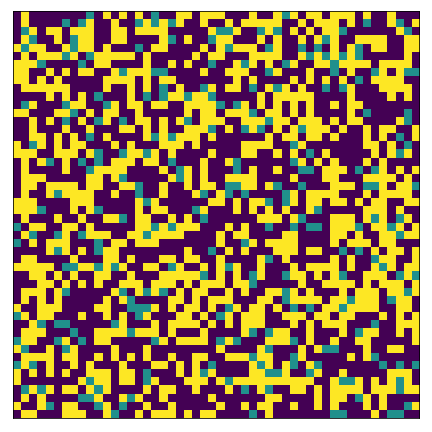

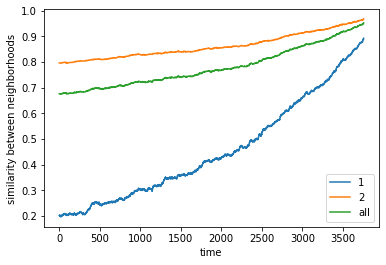

In [11]:
params = dict(n=50, 
              kernels=[5,5],              
              agents=[0, 1, 2], 
              props=[0.50, 0.10, 0.40], # we need space otherwise, they will be locked
              thresholds=[0, 0.5, 0.5],
              num_iters=5000,
              travel_lim=False,
              save_step=50, # number of time steps per frame
              seed=1)
avg_sim1, avg_sim2, avg_sim = segregate_2d(**params)        
plot2d(avg_sim1, avg_sim2, avg_sim)

#### Integrationist Preferences
Here, we add a limit to the maximum proportion desired around the agent

## Peer Effects

In [ ]:
# all cells are agents but with different status (0 for unactivated vs 1 for activated)

## Appendix

### Appendix: Breakdown of Code for Segregation in 1D

In [ ]:
# Parameters
n = 20 # neighborhood size with shape (1 x n)
agents = [0, 1, 2] # 0 is empty, 1 and 2 are the agents
props = [0.4, 0.3, 0.3] # proportions of agents must equal one
k = 3 # distance from left and right of agent
thresholds = [0, 0.3, 0.3] # threshold per agent - this is the proportion of similar agents in the locality of an agent for an agent to be happy
    

In [ ]:
# we randomly make a neighborhood based on proportions of agents and size n x n
np.random.seed(42) # we can adjust the seed when we're running multiple samples so we still retain replicability
neighborhood = np.random.choice(agents, size=n, replace=True, p=props) 

# define our kernel which we use as the "radius from the agent" to get the nearby neighbors
kernel = np.ones(shape=(k*2+1)) # it's k to the left and right of the agent
kernel[(k*2)//2]=0 # we make the center 0 because we don't want to include the agent 

# mode='same' just means that we return a matrix (of counts of similar neighbors surrounding each cell) with the same shape as the neighborhood
# the conditions are just there to tell the function whether to count or not
agent_1 = neighborhood == 1 # say we want to know the number of agents similar to 1
agent_2 = neighborhood == 2 # say we want to know the number of agents similar to 2
num_neighbors_1 = convolve(agent_1, kernel, mode='same')
num_neighbors_2 = convolve(agent_2, kernel, mode='same')
num_neighbors_total = num_neighbors_1 + num_neighbors_2

print('original array')
print(neighborhood)
print()
print('kernel')
print(kernel)
print()
print('agents 1 and 2')
print(agent_1)
print(agent_2)
print()
print('num neighbors for 1 and 2 and total for that cell')
print(num_neighbors_1)
print(num_neighbors_2)
print(num_neighbors_total)


In [ ]:
empty = neighborhood == 0

# now we find which agents are happy and which agents are not
happy_1a = num_neighbors_1/num_neighbors_total
happy_2a = num_neighbors_2/num_neighbors_total
# for both agents
frac_same = np.where(agent_1, happy_1a, happy_2a)

# we don't want to confuse False as both empty and unhappy
# for all arrays, let's indicate empty cells by np.nan 
# let's also indicate for agents 1 and 2 only those pertaining to 1 or 2
happy_1a = np.where(neighborhood==1,np.where(empty, np.nan, happy_1a), np.nan)
happy_2a = np.where(neighborhood==2,np.where(empty, np.nan, happy_2a), np.nan)
frac_same = np.where(empty, np.nan, frac_same)

# get the proportion of same neighbors in locality of each agent
avg_similarity_1 = np.nanmean(happy_1a)
avg_similarity_2 = np.nanmean(happy_2a)
avg_similarity = np.nanmean(frac_same) # proportion of same neighbots

# avg_similarities_1.append(avg_similarity_1)
# avg_similarities_2.append(avg_similarity_2)
# avg_similarities.append(avg_similarity)  

# how many happy
threshold_1 = thresholds[1] # threshold for agent 1
happy_1 = happy_1a > threshold_1
threshold_2 = thresholds[2] # threshold for agent 2
happy_2 = happy_2a > threshold_2

# we just want one array
# get the value from happy_1 if the agent =1 , else get happy_2
happy_all = np.where(agent_1, happy_1, happy_2)
happy_all = np.where(empty, np.nan, happy_all)

print('prop 1')
print(happy_1a)
print()
print('prop 2')
print(happy_2a)
print()
print('prop all')
print(frac_same)
print()
print('happy agents')
print(happy_all)
print()
print('avg similarity in neighborhoods')
print(avg_similarity_1)
print(avg_similarity_2)
print(avg_similarity)

In [ ]:
## PART 3
# from left to right (or randomly), we get the locations of unhappy agents
# and place them into an empty cell that makes the agent happy (from left to right or randomly)
# otherwise, randomly place

travel_lim = True # limit mobility to just k?

# first look for the location of an unhappy agent
sources = np.argwhere(happy_all==0).flatten() # indices of possible sources
# # if from left to right
try:        
    # source = sources[0]        
    # if random       
    source = np.random.choice(sources, size=1)[0]
except:
    print('all happy')

current_agent = neighborhood[source] # note that the agent taggings must = index [0, 1, 2] otherwise pipe will fail
agent_ = neighborhood == current_agent # we get similar neighbors
num_neighbors_ = convolve(agent_, kernel, mode='same') # get the number of neighbors per cell
threshold_ = thresholds[current_agent] # we use current agent as index of threshold
happy_ = num_neighbors_/num_neighbors_total > threshold_

# only get those with empty
empty = neighborhood == 0
happy_ = np.where(empty, happy_, np.nan) # if empty, we get it

# with travel limits
if travel_lim:
    dests = np.argwhere(happy_==True).flatten() # indices of possible destinations
    dests = [i for i in dests if i <= source+k and i >= source-k]# get destinations that are k away from source
    try: # if we can find a destination 
        dest = np.random.choice(dests, size=1)[0]
    except: # randomly assign within travel limit
        empty_inds = np.argwhere(empty==True).flatten() # indices of empty spots                    
        empty_inds = [i for i in empty_inds if i <= source+k and i >= source-k]# get empty points that are k away from source                                    
        try:
            dest = np.random.choice(empty_inds)
        except:
            dest = source # if we can't find a vacant spot, we don't move
# without travel limits
else:
    dests = np.argwhere(happy_==True).flatten() # indices of possible destinations
    try: # if we can find a destination
        # dest = dests[0] # we get the first one (or we can get randomly)
        dest = np.random.choice(dests, size=1)[0]
    except: # randomly assign       
        empty_inds = np.argwhere(empty==True).flatten() # indices of empty spots    
        try:
            dest = np.random.choice(empty_inds)
        except:
            dest = source # if we can't find a vacant spot, we don't move        
    
# we now move the agent from the destination to the source
# we then do this for several iterations
neighborhood[dest] = current_agent
neighborhood[source] = 0 # empty now       

print('all happy agents')
print(happy_all)
print()
print('possible source indices of unhappy agents')
print(sources)
print()
print('source index - unhappy')
print(source)
print()
print('current agent')
print(current_agent)
print()
print('areas where the other agents = current agent')
print(agent_)
print()
print('areas where the current agent can be happy')
print(happy_)
print()
print('possibly destinations')
print(dests)
print()
print('possible empty areas to go to')
print(empty_inds)
print()
print('selected destination')
print(dest)
print('new neighborhood')
print(neighborhood)
print()
        

In [ ]:
# let's plot
plt.imshow(neighborhood.reshape(-1, 1).T)
plt.xticks([])
plt.yticks([])


### Appendix: Breakdown of Code for Segregation 2D

In [ ]:
# Parameters
n = 10 # one side of the neighborhood, so the neighborhood becomes n x n
agents = [0, 1, 2] # 0 is empty, 1 and 2 are the agents
props = [0.1, 0.45, 0.45] # proportions of agents must equal one
k = 3 # kernel size is the size around the agent to consider. This must be odd, k x k so we have a center = 0
thresholds = [0, 0.3, 0.3] # threshold - this is the proportion of similar agents in the locality of an agent for an agent to be happy


In [ ]:
# here we break down, the algo to count neighbors per agent
# make the kernel
kernel = np.ones(shape=(k, k))
kernel[k//2, k//2] = 0 # we make the center of the kernel 0 because we don't want to count the agent in the center

# we randomly make a neighborhood based on proportions of agents and size n x n
np.random.seed(42) # we can adjust the seed when we're running multiple samples so we still retain replicability
neighborhood = np.random.choice(agents, size=(n, n), replace=True, p=props) 

# counting the number of neighbors using correlate2d
# in Think Complexity, they used boundary="wrap"
# this "tiles" the neighborhood matrix so for the cell in the top right corner, we consider the cells in the left and bottom areas
# Here, we don't do that so we use boudary="fill" or we pad with nulls. This implies that the neighborhood has edges like in real life.
# Note that Schelling made this same assumption that there are edges.
# mode (counts) surrounding a cell can thus be calculated by running the "neighborhood window" or kernel from top left to bottom right.
# mode='same' just means that we return a matrix (of counts of similar neighbors surrounding each cell) with the same shape as the neighborhood
# the conditions are just there to tell the function whether to count or not
agent_1 = neighborhood == 1 # say we want to know the number of agents similar to 1
agent_2 = neighborhood == 2 # say we want to know the number of agents similar to 1

options = dict(mode='same', boundary='fill') # here's a neat way to define arguments
num_neighbors_1 = correlate2d(agent_1, kernel, **options)
num_neighbors_2 = correlate2d(agent_2, kernel, **options)
num_neighbors_all = num_neighbors_1 + num_neighbors_2 # so we exclude empty cells

options=dict(annot=True, cmap='viridis')
sns.heatmap(neighborhood, **options)
plt.title('original neighborhood')
plt.show()
sns.heatmap(kernel, **options)
plt.title('kernel')
plt.show()
sns.heatmap(agent_1, **options)
plt.title('cells where agent 1 exists')
plt.show()
sns.heatmap(num_neighbors_1, **options)
plt.title('num neighbors like agent 1')
plt.show()
sns.heatmap(num_neighbors_all, **options)
plt.title('total num neighbors surrounding each cell')
plt.show()

In [ ]:
# now we find which agents are happy and which agents are not
# we use the threshold proportions
frac_neighbors_1 = num_neighbors_1 / num_neighbors_all
frac_neighbors_2 = num_neighbors_2 / num_neighbors_all
frac_neighbors_all = np.where(agent_1, frac_neighbors_1, frac_neighbors_2) # if agent_1, use agent 1 props, else agent 2

# remember to just select the agent (1, or 2) and remove empty cells
is_empty = neighborhood == 0    
frac_neighbors_all = np.where(is_empty, np.nan, frac_neighbors_all) # then we remove empty       

# making dissimiular/empty cells around an agent null
frac_neighbors_1 = np.where(neighborhood==1, frac_neighbors_1, np.nan)
frac_neighbors_2 = np.where(neighborhood==2, frac_neighbors_2, np.nan)       

# getting happy agents        
threshold_1 = thresholds[1] # threshold of agent 1
threshold_2 = thresholds[2] # threshold of agent 2

frac_happy_1 = frac_neighbors_1 >= threshold_1
frac_happy_2 = frac_neighbors_2 >= threshold_2

# let's be sure and remove dissimilar agents
frac_happy_1 = np.where(neighborhood==1, frac_happy_1, np.nan)
frac_happy_2 = np.where(neighborhood==2, frac_happy_2, np.nan)        

# remove empty cells    
frac_happy_all = np.where(agent_1, frac_happy_1, frac_happy_2) # if agent_1, use agent 1 happiness, else agent 2
frac_happy_all = np.where(is_empty, np.nan, frac_happy_all) # then we remove empty

# calculate the proportion of like-neighbors per agent
avg_frac_1 = np.nanmean(frac_neighbors_1)
avg_frac_2 = np.nanmean(frac_neighbors_2)
avg_frac_all = np.nanmean(frac_neighbors_all) 

# # for tracking of segregation over time
# avg_similarities_1.append(avg_frac_1)
# avg_similarities_2.append(avg_frac_2)
# avg_similarities_all.append(avg_frac_all)  

sns.heatmap(neighborhood, **options)
plt.title('original neighborhood')
plt.show()

sns.heatmap(frac_neighbors_1, **options)
plt.title('frac similar neighbors surrounding each agent 1')
plt.show()

sns.heatmap(frac_happy_1, **options)
plt.title('happy agent 1s')
plt.show()

sns.heatmap(frac_happy_2, **options)
plt.title('happy agent 2s')
plt.show()

sns.heatmap(frac_happy_all, **options)
plt.title('all happy agents')
plt.show()

print('average similar prop agent 1, 2, total', avg_frac_1, avg_frac_2, avg_frac_all)

In [ ]:
# now for each unhappy agent, we randomly place into an empty cell so they are happy
# we may impose a travel limit to just the local neighborhood
travel_lim=False

# get the coordinates of unhappy cells
unhappy_coords = [(i[0][0], i[0][1]) for i in list(zip(np.argwhere(frac_happy_all==0)))] # this is two lists that we need to convert to a (x, y)

# get the coordinates of empty cells
empty_coords = [(i[0][0], i[0][1]) for i in list(zip(np.argwhere(np.isnan(frac_happy_all))))]

# switch places one agent at a time
unhappy_agent_coord_ind = np.random.choice(range(len(unhappy_coords)))
unhappy_agent_coord = unhappy_coords[unhappy_agent_coord_ind]
unhappy_agent = neighborhood[unhappy_agent_coord]

if travel_lim:
#     we limit the possible empty locations to only that surrounding the selected agent
# coordinates surrounding the agent
    empty_coords = [i for i in empty_coords if i[0] >= unhappy_agent_coord[0] - k//2 
                             and i[0] <= unhappy_agent_coord[0] + k//2 
                             and i[1] >= unhappy_agent_coord[1] - k//2 
                             and i[1] <= unhappy_agent_coord[1] + k//2]
    empty_coord_ind = np.random.choice(range(len(empty_coords)))
    empty_coord = empty_coords[empty_coord_ind]        
    
else: # no travel limits    
    empty_coord_ind = np.random.choice(range(len(empty_coords)))
    empty_coord = empty_coords[empty_coord_ind]    

# then we switch an unhappy cell with an empty cell
neighborhood[empty_coord] = unhappy_agent
neighborhood[unhappy_agent_coord] = 0

sns.heatmap(neighborhood, **options)
